In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as im
from scipy.special import factorial
from random import random

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Binomial-Distribution" data-toc-modified-id="Binomial-Distribution-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Binomial Distribution</a></span></li><li><span><a href="#Arnold's-Cat-Map" data-toc-modified-id="Arnold's-Cat-Map-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Arnold's Cat Map</a></span></li><li><span><a href="#Chirikov’s-Standard-Map" data-toc-modified-id="Chirikov’s-Standard-Map-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Chirikov’s Standard Map</a></span><ul class="toc-item"><li><span><a href="#Small-$\epsilon$" data-toc-modified-id="Small-$\epsilon$-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Small $\epsilon$</a></span></li><li><span><a href="#Large-$\epsilon$" data-toc-modified-id="Large-$\epsilon$-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Large $\epsilon$</a></span></li></ul></li><li><span><a href="#Ising-model-in-two-dimensions" data-toc-modified-id="Ising-model-in-two-dimensions-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Ising model in two dimensions</a></span><ul class="toc-item"><li><span><a href="#The-Lattice-Function" data-toc-modified-id="The-Lattice-Function-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>The Lattice Function</a></span></li><li><span><a href="#Spin-Flip-Function" data-toc-modified-id="Spin-Flip-Function-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Spin Flip Function</a></span></li><li><span><a href="#Lattice-Magnetization-Function" data-toc-modified-id="Lattice-Magnetization-Function-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Lattice Magnetization Function</a></span></li><li><span><a href="#Average-Magnetization" data-toc-modified-id="Average-Magnetization-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Average Magnetization</a></span></li><li><span><a href="#Mean-Equilibrium-Magnetization-Plot-Function" data-toc-modified-id="Mean-Equilibrium-Magnetization-Plot-Function-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Mean Equilibrium Magnetization Plot Function</a></span></li><li><span><a href="#Running-the-Monte-Carlo-Algorithm" data-toc-modified-id="Running-the-Monte-Carlo-Algorithm-4.6"><span class="toc-item-num">4.6&nbsp;&nbsp;</span>Running the Monte Carlo Algorithm</a></span></li><li><span><a href="#Positive-Initial-Magnetization" data-toc-modified-id="Positive-Initial-Magnetization-4.7"><span class="toc-item-num">4.7&nbsp;&nbsp;</span>Positive Initial Magnetization</a></span></li><li><span><a href="#Negative-Initial-Magnetization" data-toc-modified-id="Negative-Initial-Magnetization-4.8"><span class="toc-item-num">4.8&nbsp;&nbsp;</span>Negative Initial Magnetization</a></span></li><li><span><a href="#Comments-on-the-Ising-Model" data-toc-modified-id="Comments-on-the-Ising-Model-4.9"><span class="toc-item-num">4.9&nbsp;&nbsp;</span>Comments on the Ising Model</a></span></li></ul></li></ul></div>

## Binomial Distribution

The binomial distribution for the random walker is given by (1.2.10) in Reif. Using a computer algebra program, make a plot of the binomial probability distribution $P_N(m)$ for a random walker with $p = q = \frac{1}{2}$ for $N = 5, 10, 20$ steps. Recall that the average is $\overline{m} = N (p - q)$ and the dispersion is $\overline{(\Delta m)^2} = 4N pq$. On the same graph, plot the Gaussian probability distribution with the same average and dispersion. Do the same for a random walker with $p = \frac{2}{3},\: q = \frac{1}{3}$ .

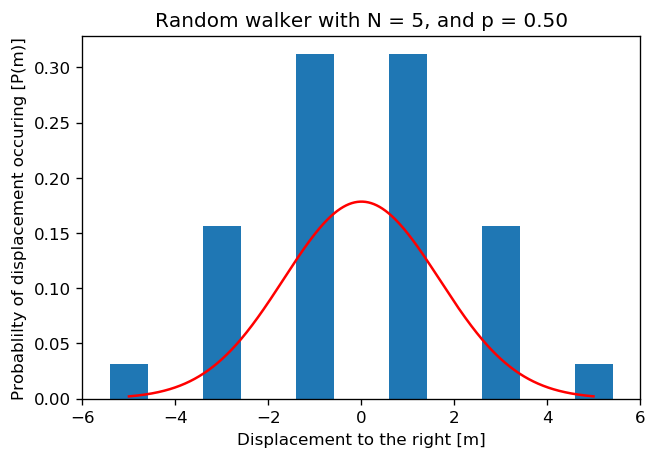

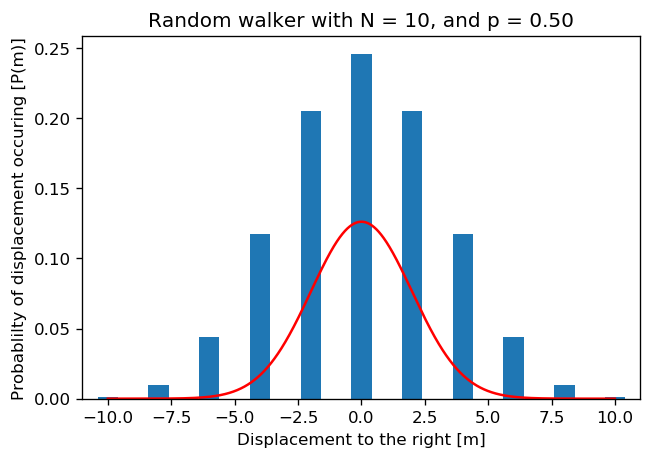

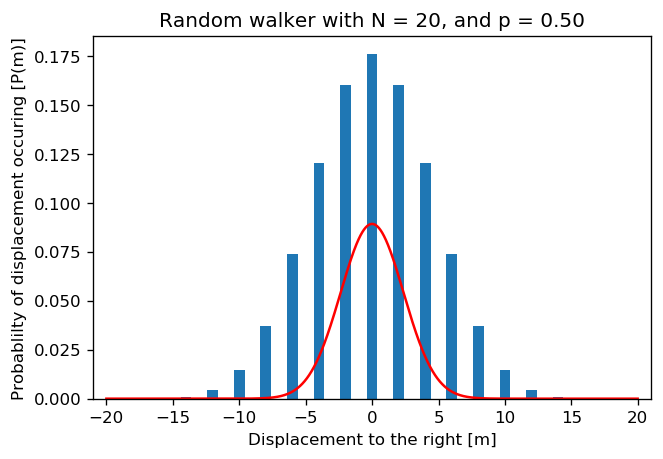

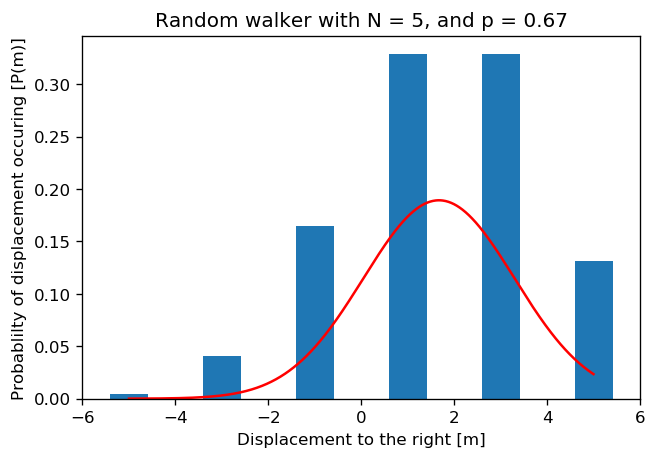

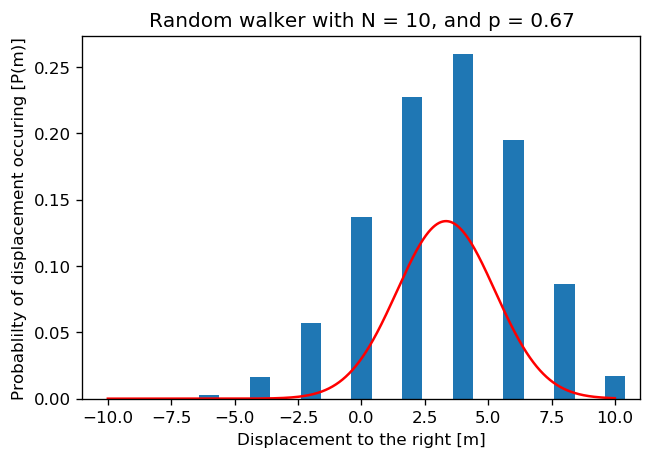

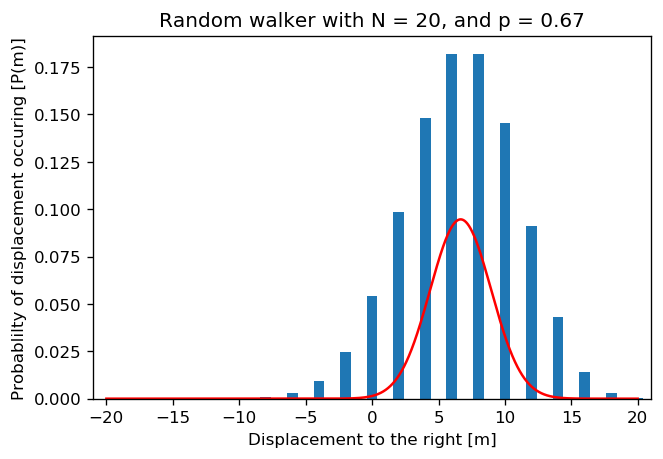

In [10]:
# define binominal dristribution
def BinDist(N, m, p):
    return (factorial(N) / (factorial((N + m) / 2) * factorial(
        (N - m) / 2)) * (p**((N + m) / 2)) * (1 - p)**((N - m) / 2))


# plots the distribution of the random walk for
# given input values N, p, q
def RandomWalker(N, p, q):
    x = np.arange(-N, N, 0.01)
    m = np.arange(-N, N + 1, 2)

    plt.figure()
    plt.bar(m, BinDist(N, m, p))
    plt.plot(x, gaussian(x, N, p, q), 'r')
    tit = 'Random walker with N = %0.0f, and p = %0.2f' % (N, p)
    plt.title(tit)
    plt.xlim(-N - 1, N + 1)
    plt.xlabel('Displacement to the right [m]')
    plt.ylabel('Probablilty of displacement occuring [P(m)]')
    plt.show()


# definition of gaussian
def gaussian(m, N, p, q):
    '''gaussian function'''
    return np.exp(-(m - N * (p - q))**2 /
                  (8 * np.pi * N * p * q)**0.5) / (8 * np.pi * N * p * q)**0.5


plt.rcParams['figure.dpi'] = 120
p1 = 1 / 2
q1 = p1
RandomWalker(5, p1, q1)
RandomWalker(10, p1, q1)
RandomWalker(20, p1, q1)

p2 = 2 / 3
q2 = 1 / 3
RandomWalker(5, p2, q2)
RandomWalker(10, p2, q2)
RandomWalker(20, p2, q2)

## Arnold's Cat Map

The so-called “Arnold’s cat map” is a map of the $L \times L$ square onto itself by

$$
\begin{pmatrix} 
x\\
y\\
\end{pmatrix}
\rightarrow
\begin{pmatrix} 
x'\\
y'\\
\end{pmatrix}
= 
\begin{pmatrix} 
x+y\\
y+2y\\
\end{pmatrix}
\text{mod}\:L
$$

Modulo $L$ means that a point $(x_0 , y_0 )$ is identified with a point $(x_0 + L, y_0 + L)$. Note that the map is area-preserving, and thus the Poincare’s recurrence theorem applies. Applying the map to an array of $N \times N$ pixels produces a transformation of a square image. One interesting property of the Arnold’s cat map is that the recurrence “times” are quite small. The recurrence time here is the number of times $M$ you apply the map in sequence, until the image returns to itself. Write a computer algebra program that applies the Arnold’s cat map $M$ times to your chosen square image of $N \times N$ pixels. What is the value of $M$ after which your image comes back to where you started? Do this exercise for $N = 10, N = 32, N = 124$. 

In [15]:
def get_image(pic):
    '''imports and displays the image.
    Takes one parameter, the filename of the image.'''
    the_pic = im.imread(pic)
    print(the_pic.dtype, the_pic.shape, sep='\n')
    plt.imshow(the_pic)
    plt.show()
    return the_pic


# end def


def arnolds_cat_map(narr, N):
    '''Runs arnolds cat map transform on the image.
    Takes in two parameters, the image as an array, and the pixel dimansions.'''
    ## x to x + y
    ## y to x + 2y
    ## in our array the first index is x and the second is y
    cat = np.zeros([N, N, 3])
    #print(cat)
    for i in range(0, N):
        for j in range(0, N):
            cat[i][j] = narr[(i + j) % N][(i + 2 * j) % N]
        # end for
    # end for
    plt.imshow(cat.astype(np.uint8))
    plt.show()
    return cat


# end def


def rec_cat(org, curr, N):
    '''recurrsively tests if the image is back to its original layout.
    Takes three parameters the original image, the current image, 
    and the number of pixels.'''
    ## base case
    if np.array_equal(org, curr):
        return curr
    # end if
    ## recurrsive call
    else:
        # runs the cat map on the current state of our image
        curr = arnolds_cat_map(curr, N)
        return rec_cat(org, curr, N)
    # end else


# end def

uint8
(10, 10, 3)


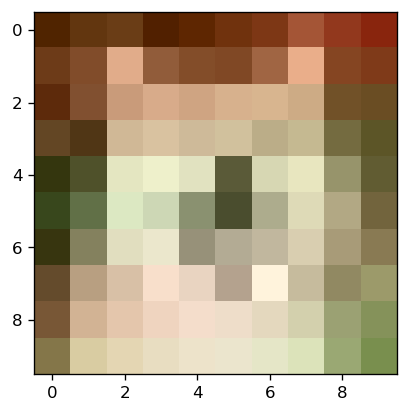

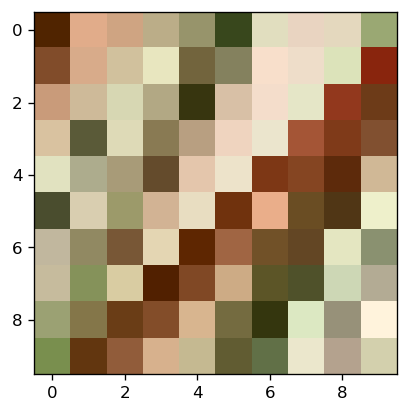

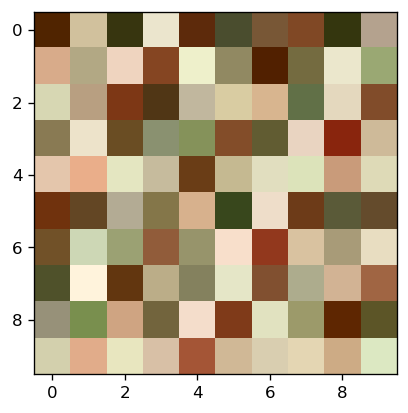

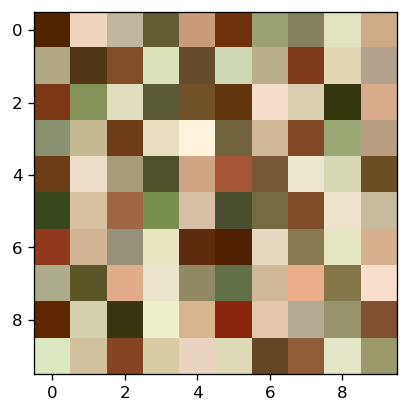

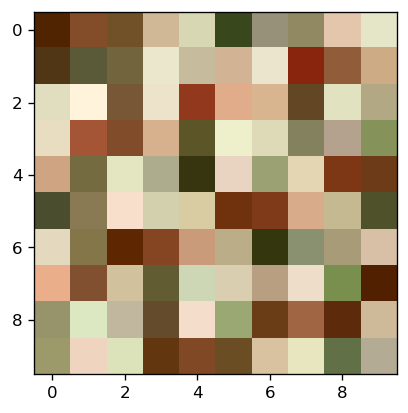

...

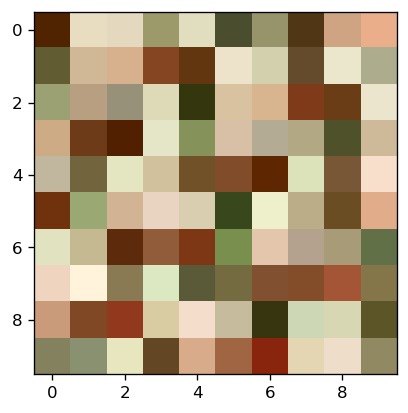

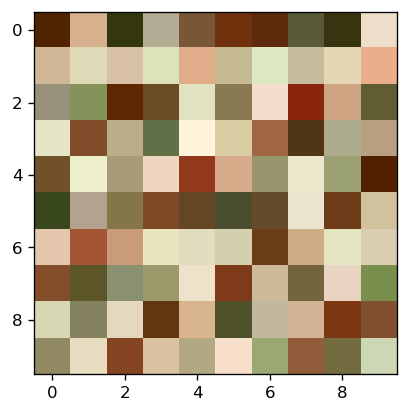

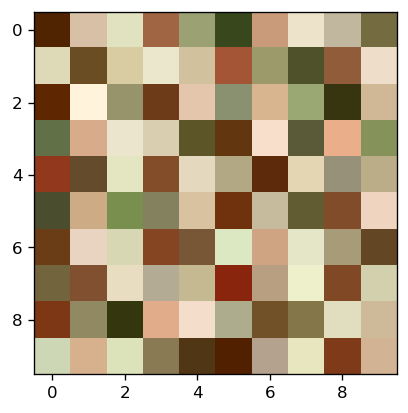

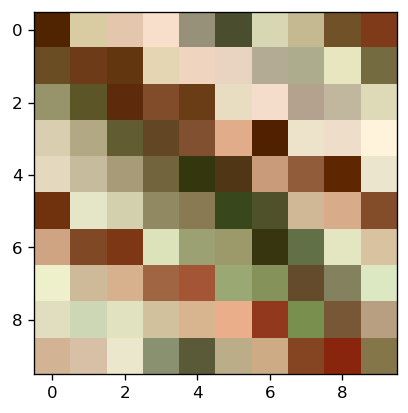

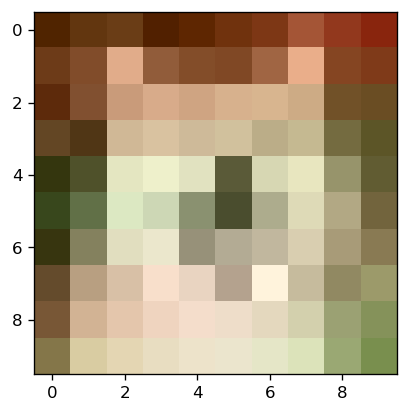

In [17]:
## 10 x 10
dog10 = get_image('doge10.jpeg')
ardog = arnolds_cat_map(dog10, 10)
ardog = rec_cat(dog10, ardog, 10)


uint8
(32, 32, 3)


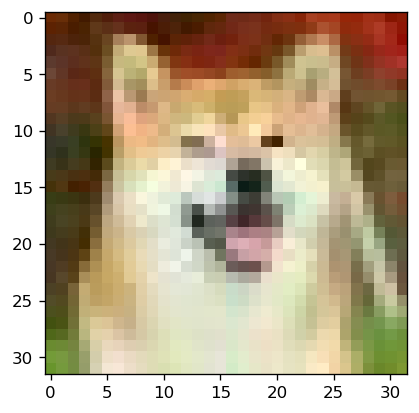

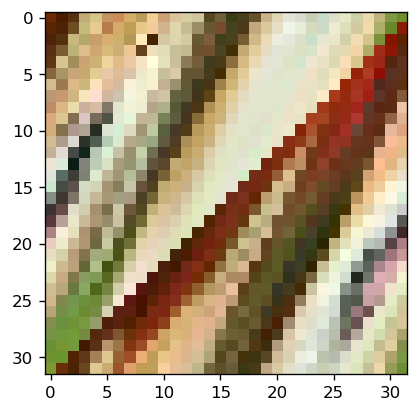

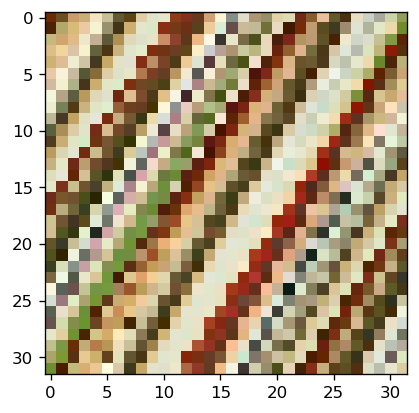

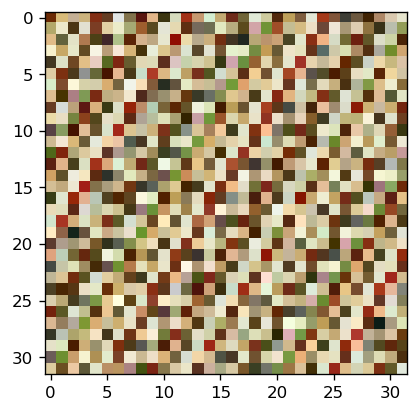

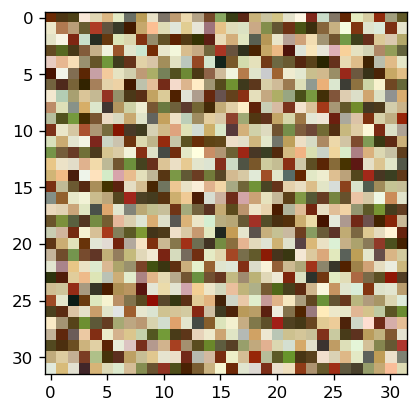

...

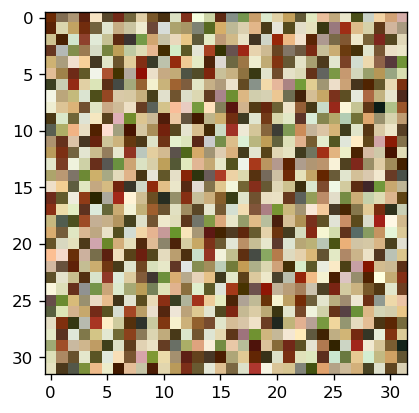

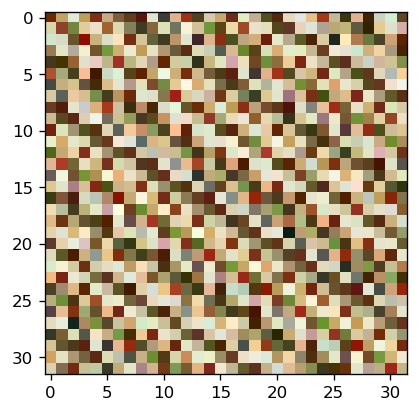

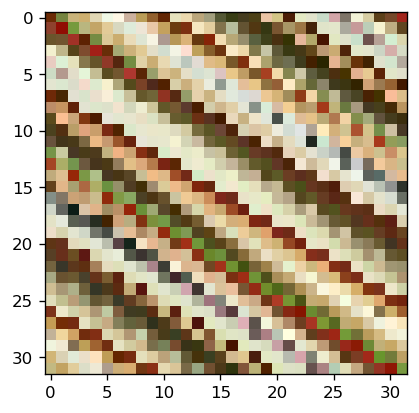

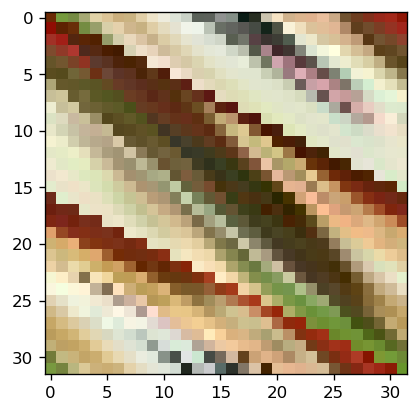

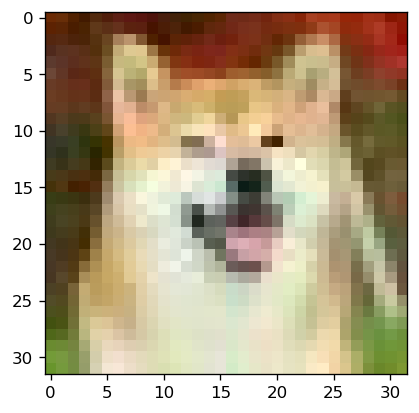

In [18]:
## 32 x 32
dog32 = get_image('doge32.jpeg')
ardog = arnolds_cat_map(dog32, 32)
ardog = rec_cat(dog32, ardog, 32)

uint8
(124, 124, 3)


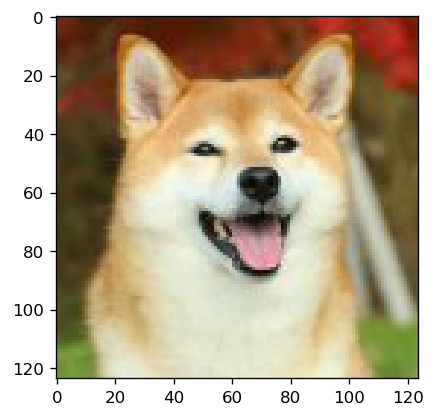

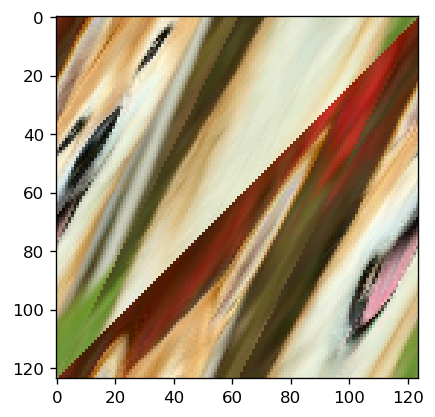

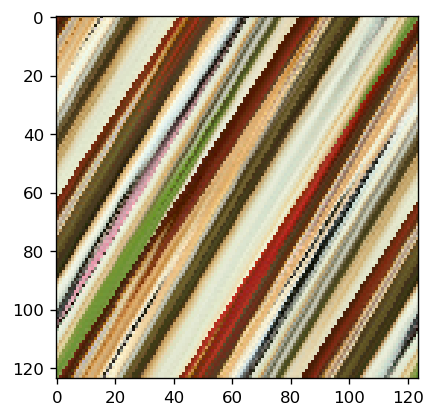

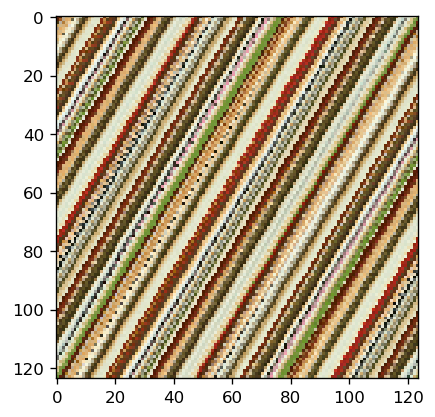

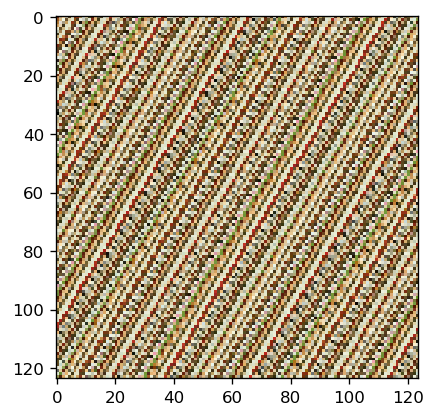

...

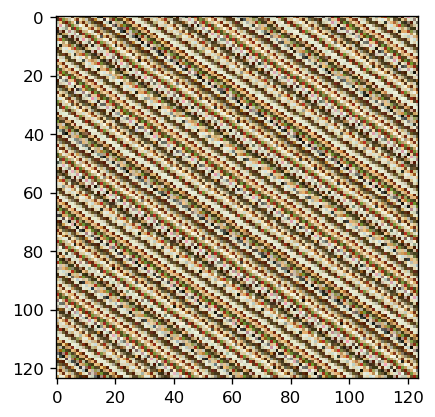

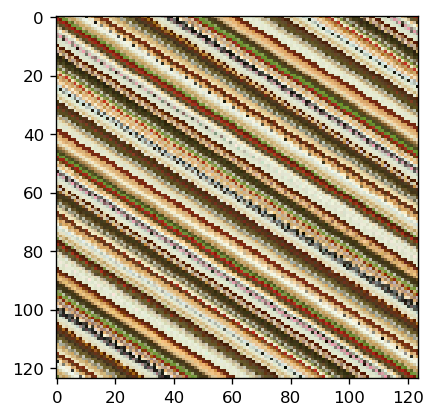

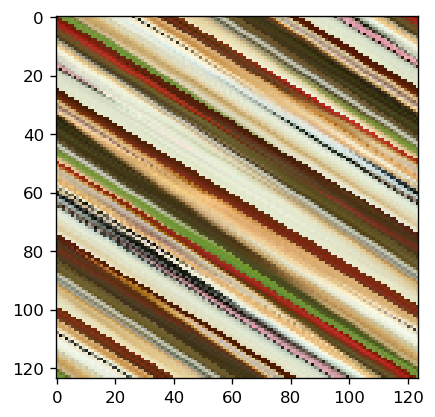

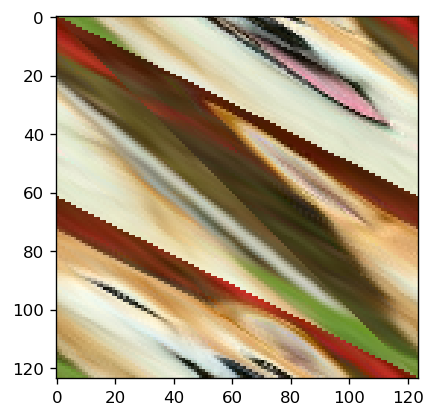

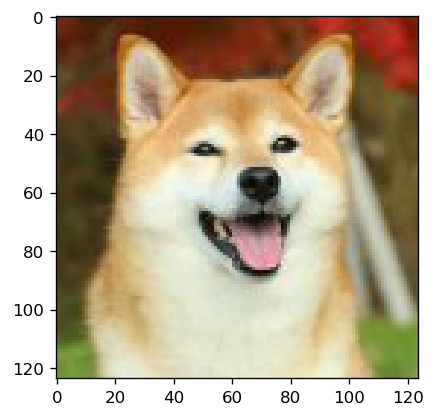

In [19]:
## 124 x 124
dog124 = get_image('doge124.jpeg')
ardog = arnolds_cat_map(dog124, 124)
ardog = rec_cat(dog124, ardog, 124)

## Chirikov’s Standard Map

The following map of the two-dimensional periodic phase space

$$
\begin{pmatrix} 
p\\
q\\
\end{pmatrix}
\rightarrow
\begin{pmatrix} 
p'\\
q'\\
\end{pmatrix}
= 
\begin{pmatrix} 
p+\epsilon \sin{q}\\
p+q+\epsilon \sin{q}\\
\end{pmatrix}
\text{mod}\:2\pi
$$

with a free parameter $\epsilon$ is called Chirikov’s standard map. It is a map of the $2\pi \times 2\pi$
square onto itself.

First we show that the map is volume preserving, by showing it satisfies Liouiville's Theorem.

$$p' = p +\epsilon \sin{q}$$
$$q' = p+q+\epsilon \sin{q}$$

Derivatives

$\frac{\partial p'}{\partial p} = 1$ 

$\frac{\partial q'}{\partial p} = 1$

$\frac{\partial p'}{\partial q} = \epsilon \cos{q}$ 

$\frac{\partial q'}{\partial q} = 1+ \epsilon \cos{q}$

Louiville's Theorem

$\frac{\partial p'}{\partial p}\frac{\partial q'}{\partial q} - \frac{\partial q'}{\partial p}\frac{\partial p'}{\partial q} $

for us we get 
$ 1\cdot (1+\epsilon \cos{q}) - 1\cdot (\epsilon \cos{q}) = 1 $

Thus, by the Louiville's Theorem, the map is volume preserving.

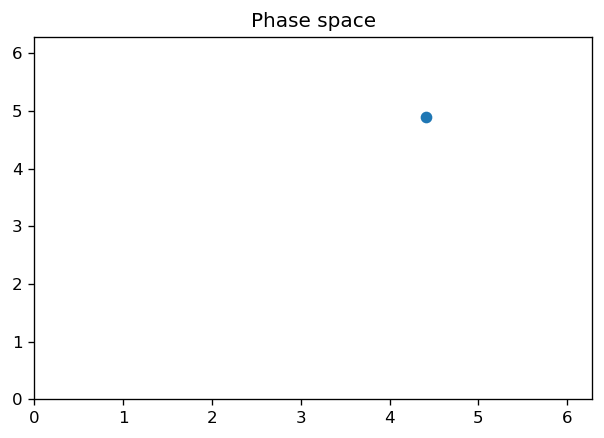

In [22]:
## initial point
ap = [2*random()*np.pi, 2*random()*np.pi]

plt.scatter(ap[0], ap[1])
plt.title('Phase space')
plt.xlim([0, 2*np.pi])
plt.ylim([0, 2*np.pi])
plt.show()

### Small $\epsilon$
Take $\epsilon$ to be a small number. Will a given point $(p_0 , q_0 )$ will explore all of the phase space under successive applications of the map?

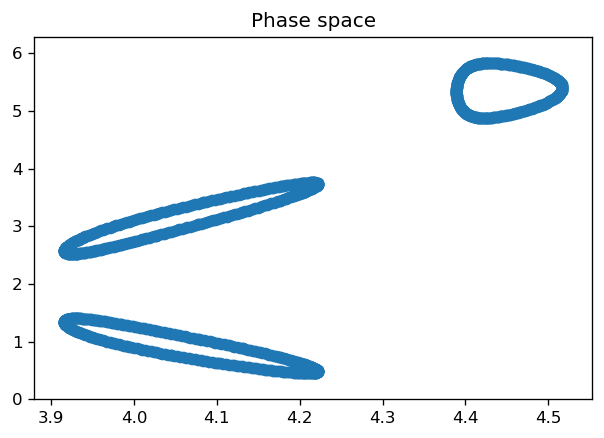

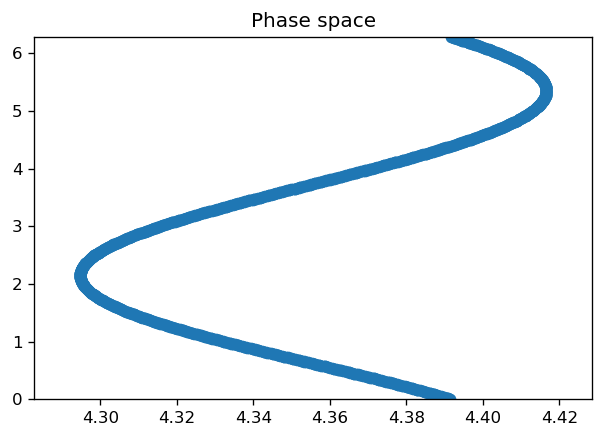

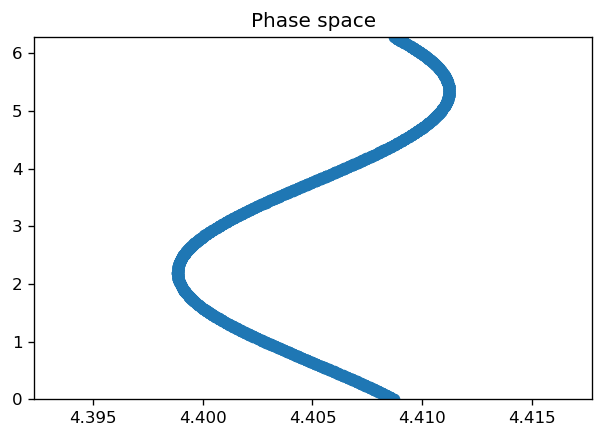

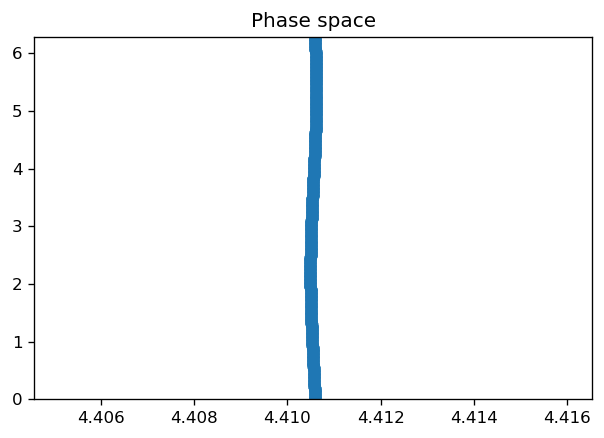

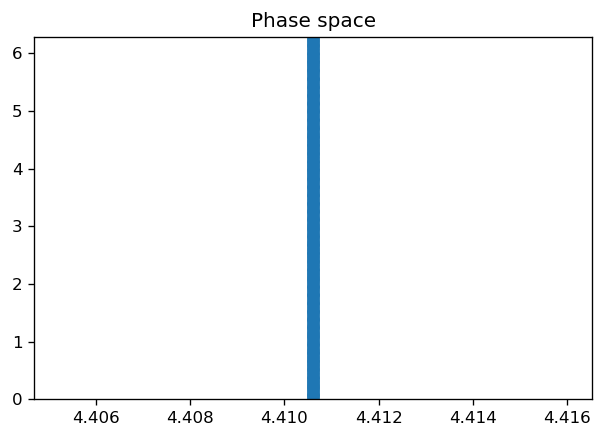

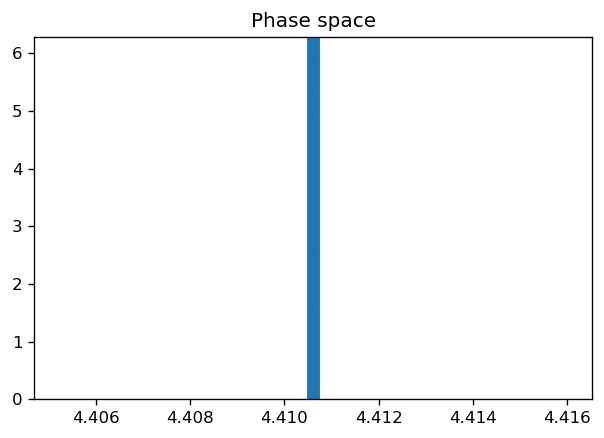

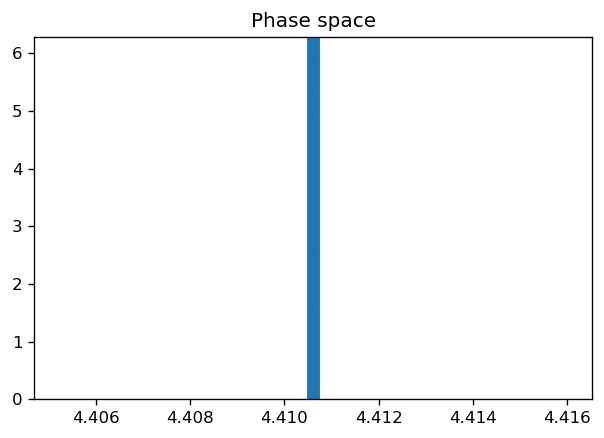

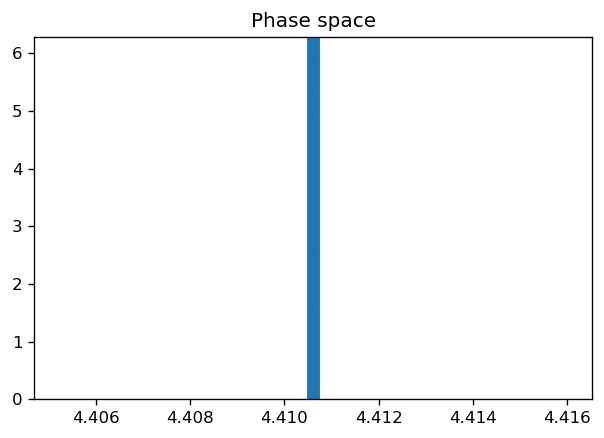

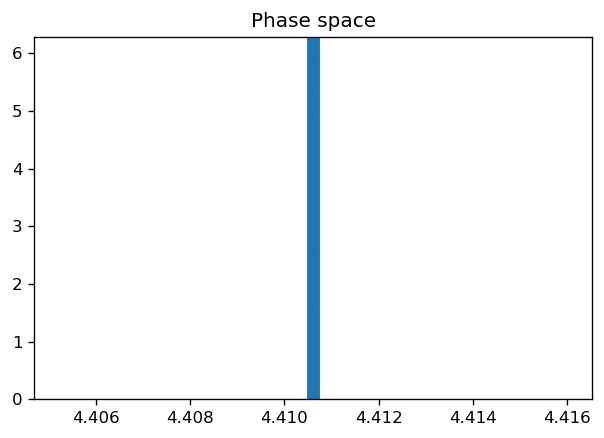

In [24]:
## Chirikov’s Standard Map

def CSM(pt, e):
    ## x to x + e sin(y)
    ## y to x + y + e sin(y)
    x, y = pt
    return [(x + e*np.sin(y))%(2*np.pi), (x+y+e*np.sin(y))%(2*np.pi)]
# end def 

def explore(curr, e):
    '''explores the phase space'''
    xs = []
    ys = []
    for i in range(0, 1000):
        curr = CSM(curr, e)
        xs.append(curr[0])
        ys.append(curr[1])
    # end for
    plt.scatter(xs,ys)
    plt.title('Phase space')
    #plt.xlim([0, 2*np.pi])
    plt.ylim([0, 2*np.pi])
    plt.show()
# end def


## part c, make e really big
for a in [0.5, 0.1, 0.01, 1e-4, 1e-8, 1e-15, 1e-20, 1e-25, 1e-30]:
    explore(ap,a)

As we can see from the above plot, the point only occupies discrete spots.

### Large $\epsilon$

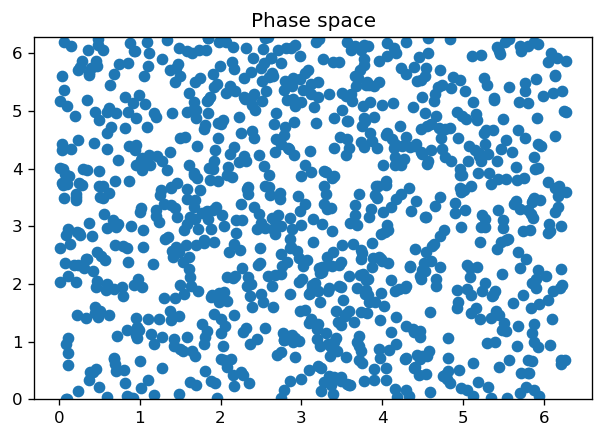

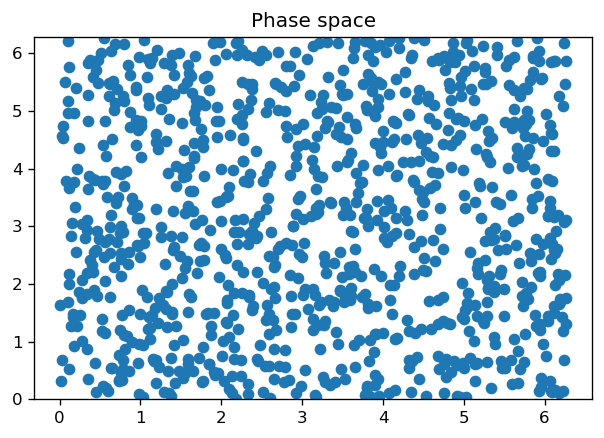

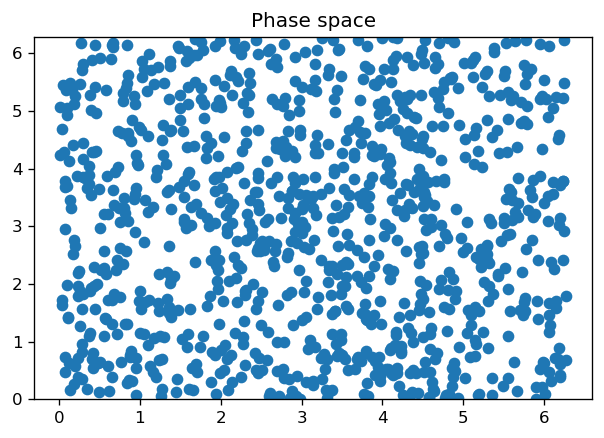

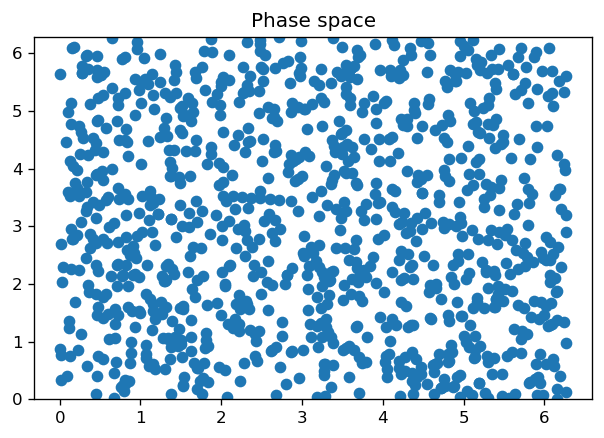

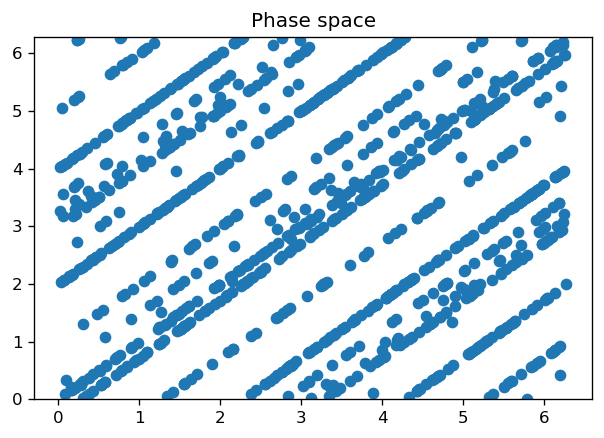

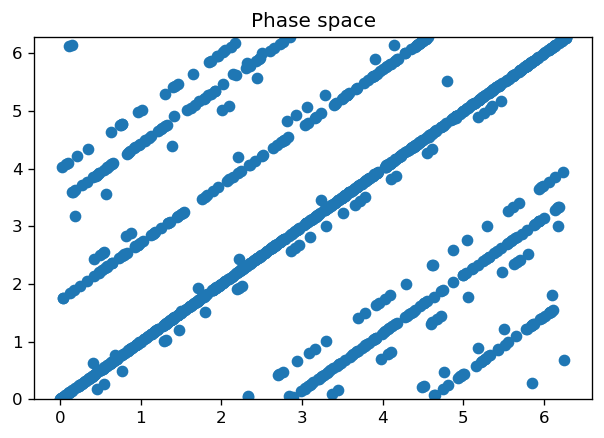

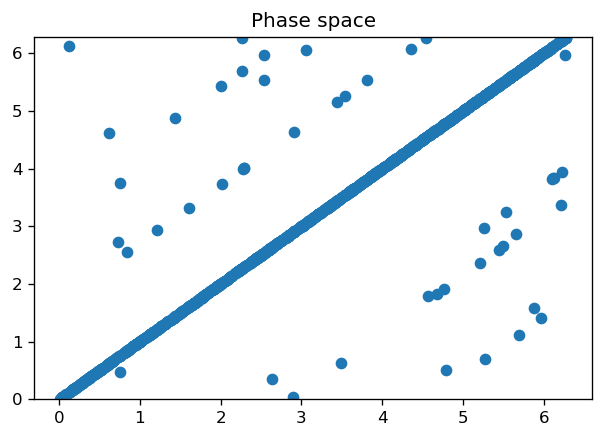

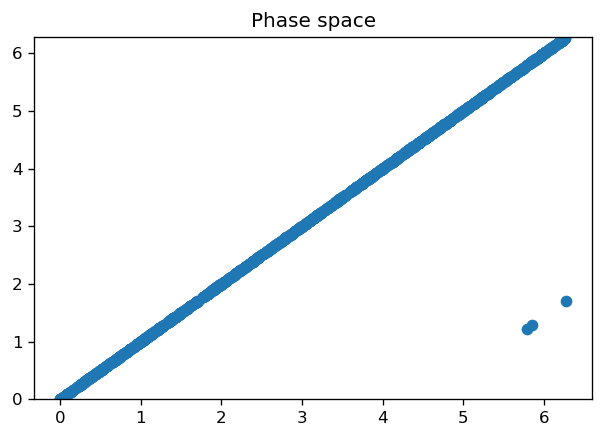

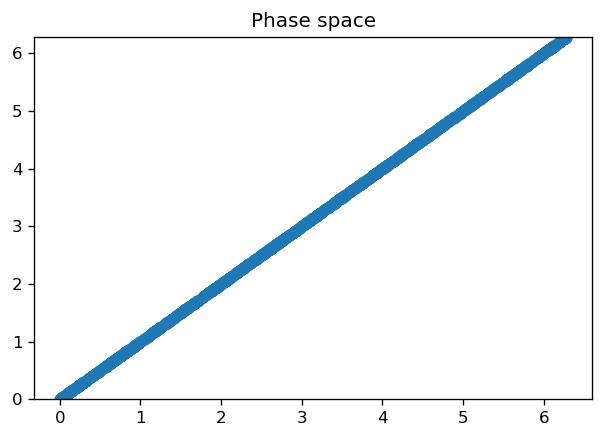

In [25]:
## part c, make e really big
for a in [1e3, 1e7, 1e10, 1e15, 1e16, 1e17, 1e18, 1e19, 1e25]:
    explore(ap,a)
# end for

For a certain range of points, it appeared as though the whole space would be filled. However, for extremely large values of epsilon, all the points in phase space converge to a line.

## Ising model in two dimensions 

Simulate the Ising model in two dimensions on a $50 \times 50$ square lattice. The Hamiltonian is

$$H = -J \sum^{}_{\left< i j \right>} \sigma_i \sigma_j$$

where $\sigma_i = \pm 1$, the sum is over all nearest-neighbor pairs, and periodic boundary conditions are used for all states. Use importance sampling and the Metropolis algorithm to simulate the canonical ensemble at inverse temperature $\beta$. Use a larger lattice if your computer is fast enough. 
Perform your Monte-Carlo runs at several different temperatures, and plot the
average magnetization

$$\overline{m} = \frac{1}{N} \overline{\sum_i\sigma_i}$$

as a function of $\beta J$ (or of $kT /J$).

Does the Monte-Carlo time required to reach the equilibrium time depend on your initial state? Do you see a signature of the phase transition? How does the transition temperature you find compare with the analytical answer $kT c \approx 2.269J$ (the exact result is $\sinh{(2J/kT c }) = 1$)?

### The Lattice Function

This function creates an $\big(l \times l\big)$ with all the spins randomly determined (+1 or -1) such that the initial mean magnetization is $ \overline{m_0} $.  Let $P_-$ be the probabliliy particle on the lattice has spin -1, and let $P_+$ be the probabliliy particle on the lattice has spin +1. Then we know, $P_+ + P_-  = 1$, and $(+1)P_+ + (-1)P_-= \overline{m_0}$. Hence we get the following probability distributions for particles being spin up or down as a function of $\overline{m_0}$. 

Thus, to construct our lattice we use the probability distribution for spin up, and for every point on the lattice we roll a random number to determine the spin of the particle. By using the probability distribution, $P_+ = \frac{1+\overline{m_0}}{2}$, to select the spin up particles in the lattice, the resulting arrangments of spin will give the lattice a magnetization of $\overline{m_0}$.

In [26]:
def lattice_function(initial_mag, l):
    '''
    @params: initial mean magnetization m_0, and the size of the lattice, l.
    @returns: an (l x l) lattice with the magnetization m_0.
    '''
    prob_up = (1+initial_mag)/2
    lattice = np.zeros((l, l))
    for i in range(0, l):
        for j in range(0, l):
            if random() < prob_up:
                lattice[i, j] = 1
            # end if
            else:
                lattice[i, j] = -1
            # end else
        # end for
    # end for
    return lattice
# end def

### Spin Flip Function

This function encapsulates steps 2 through 5 that the Metopolis paper outlined. We start with a lattice of spins, and pick one arbitrary spin to flip with coordinates $(i,\:j)$. That is, the first lattice had energy $E_{\text{old}}$, and after flipping the spin the new energy of the lattice is $$E_{\text{new}} = E_{\text{old}} - J\sigma_{ij}\big(\sigma_{(i-1)j} + \sigma_{(i+1)j} + \sigma_{i(j-1)} + \sigma_{i(j+1)}\big) +J\big(-\sigma_{ij}\big)\big(\sigma_{(i-1)j} + \sigma_{(i+1)j} + \sigma_{i(j-1)} + \sigma_{i(j+1)}\big)$$

$$E_{\text{new}} = E_{\text{old}} - 2J\sigma_{ij}\big(\sigma_{(i-1)j} + \sigma_{(i+1)j} + \sigma_{i(j-1)}+ \sigma_{i(j+1)}\big)$$

where we subtract the old spin contribution to the energy from $\sigma_{ij}$, and add the new spin energy contribution from $\sigma_{ij}$, which is just negative the old contribution. 

We are interested in the change in energy from $E_{\text{old}}$ to $E_{\text{new}}$. That is we want, $\Delta E = E_{\text{new}} -E_{\text{old}}$, which simplifies to,

$$\Delta E = 2J\sigma_{ij}\big(\sigma_{(i-1)j} + \sigma_{(i+1)j} + \sigma_{i(j-1)}+ \sigma_{i(j+1)}\big)$$

Next, we check if the change in energy, $\Delta E$, is less than or equal to zero or that a random roll is less than the probablilty function $e^{-\beta \Delta E }$. If either of those conditions are true, the function accepts the new state and returns the new lattice configuration. Otherwise, the old lattice is returned.

In [27]:
def spin_flip_function(lattice, beta, l, J=1):
    '''
    @params: a two dim square matrix holding the arrangements 
    of spin in the lattice. A beta value (inverse temerature value, k = 1). 
    l is the length of the lattice (l x l). And J is the coupling constant.
    @returns: a two dim square matrix holding the arrangements 
    of spin in the lattice, which maybe be the same as the initial lattice.
    '''
    i, j = (int(random()*l), int(random()*l))
    DE = 2*J*(lattice[i, j]) * (lattice[(i-1)%l, j] 
                              + lattice[(i+1)%l, j] 
                              + lattice[i, (j-1)%l] 
                              + lattice[i, (j+1)%l])
    if (DE <= 0 or np.random.uniform(0, 1) < np.exp(-beta*DE)):
        lattice[i, j]  = -lattice[i, j]
    # end if
    return lattice
# end def

### Lattice Magnetization Function

This function runs the spin flip algorithm (Metropolis Alorithm) $n$ times. For each iteration, the magnetization of the lattice is calculated after the spin flip algorithm runs. All of this happens for a given $\beta$ value passed to the function. If the graph flag is set, then the magnetization as a function of the Monty Carlo time is plotted for that particular value of $\beta$. We will use these plots to determine when equilibrium is reached. Finally the array of magnetizations for each of the lattice arrangements is returned.

In [28]:
def lattice_magnetization_function(lattice, beta, l, n, m_0):
    '''
    @params: a two dim square matrix holding the arrangements 
    of spin in the lattice. A beta value (inverse temerature value, k = 1). 
    l is the length of the lattice (l x l). And n is the number of iterations.
    @returns: a two column matrix holding the magnetization of a given
    lattice spin configuration.
    '''
    latt_mags = np.zeros(n)
    latt_mags[0] = np.sum(lattice)/l**2  
    for a in range(1, n):
        lattice = spin_flip_function(lattice, beta, l)
        latt_mags[a] = np.sum(lattice)/l**2
    # end for 
    fig, ax = plt.subplots(figsize= (10, 6))
    ax.plot(np.linspace(0, n, n), latt_mags)
    ax.set_title('Lattice Magnetization over MC time step when $\\beta J = %0.2f$ and $m_0 = %0.2f$' %(beta, m_0))
    ax.set_xlabel('MC time step')
    ax.set_ylabel('Magnetization of the Lattice')
    ax.set_ylim((latt_mags.min(), latt_mags.max()))
    return latt_mags
# end def

### Average Magnetization

This functions computes the Monte Carlo time average of all the magnetizations of the lattice, when the system is in equilibrium. Equilibrium happens after many iterations, there is a big number used to take the end values from the mean magnetization to ensure we only use equilibrium mean magnetizations. Near the critical value $kT_c = 2.269J$ (ie $\beta = 0.441J$), equilibrium is never truly reached, but it works very well of all the other $\beta$ values.

In [29]:
def average_magnetization(lattice, beta, l, n, m_0):
    '''
    @params: a two dim square matrix holding the arrangements 
    of spin in the lattice. A beta value (inverse temerature value, k = 1). 
    l is the length of the lattice (l x l). And n is the number of iterations.
    @returns: The average magnetization after equilibrium was reached.
    '''
    big_num = 10**4
    mags = lattice_magnetization_function(lattice, beta, l, n, m_0)
    end_of_mags = mags[big_num:]
    return np.mean(end_of_mags)
# end def

### Mean Equilibrium Magnetization Plot Function

This plots all the mean magnetizations vs beta values (inverse temperature values) for a given initial magnetization, $\overline{m_0}$, of the lattice.  

In [30]:
## plot mean equilibrium magnetization
def mean_equil_mag_plot_function(beta, mean_mags, ICM):
    '''
    @params: array of beta values, array of accociated mean magnetizations.
    '''
    fig, ax = plt.subplots(figsize= (10, 6))
    ax.scatter(beta, mean_mags)
    ax.set_title('Average Equilibrium Magnetization of the lattice as a funtion of $\\beta J$ for an initial magnetization of %s' %ICM)
    ax.set_xlabel('$\\beta J$')
    ax.set_ylabel('Magnetization of the Lattice')
    plt.show()
# end def

### Running the Monte Carlo Algorithm

This function orchestrates the whole Monty Carlo Algorithm. It takes in the length of the square lattice, the initial magnetization, and the number of monte carlo time steps. The function first constructs an array of beta values, and includes extra values near the critical temperature $T_C = 2.269J$. Next, a lattice is initialized with $\overline{m_0}$, and $l$. Then for each value of $\beta$ the mean_magnetization is found using the Metropolis algorithm. Finally the mean equilibrium magnetization is plotted as a function of $\beta$.  

In [31]:
l = 50
def run_MC(l, init_mag, n = 10**5):
    '''
    @params: length of the square lattice l, 
    initial magnetization of the lattice init_mag,
    and number of monty carto time steps n.
    '''
    beta = np.array([0.05, 0.1, 0.2, 0.3, 0.4, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.50, 0.6, 0.7, 0.8, 0.9, 1])
    bl = len(beta)
    mean_mags = np.zeros(bl)
    for b in range(bl):
        lattice = lattice_function(init_mag, l)
        mean_mags[b] = average_magnetization(lattice, beta[b], l, n, init_mag)
    # end for
    mean_equil_mag_plot_function(beta, mean_mags, init_mag)
# end def

### Positive Initial Magnetization

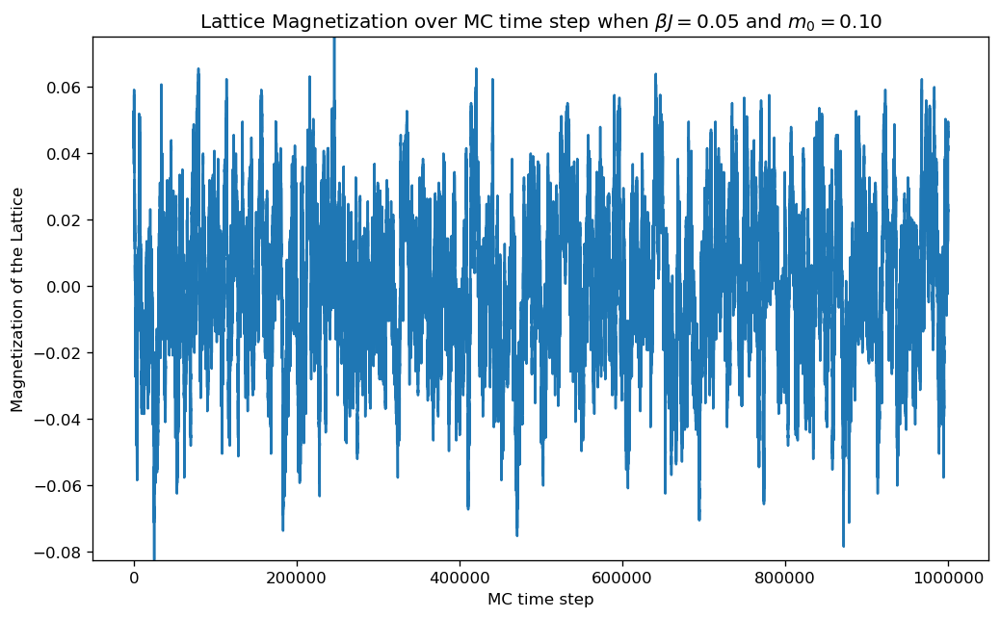

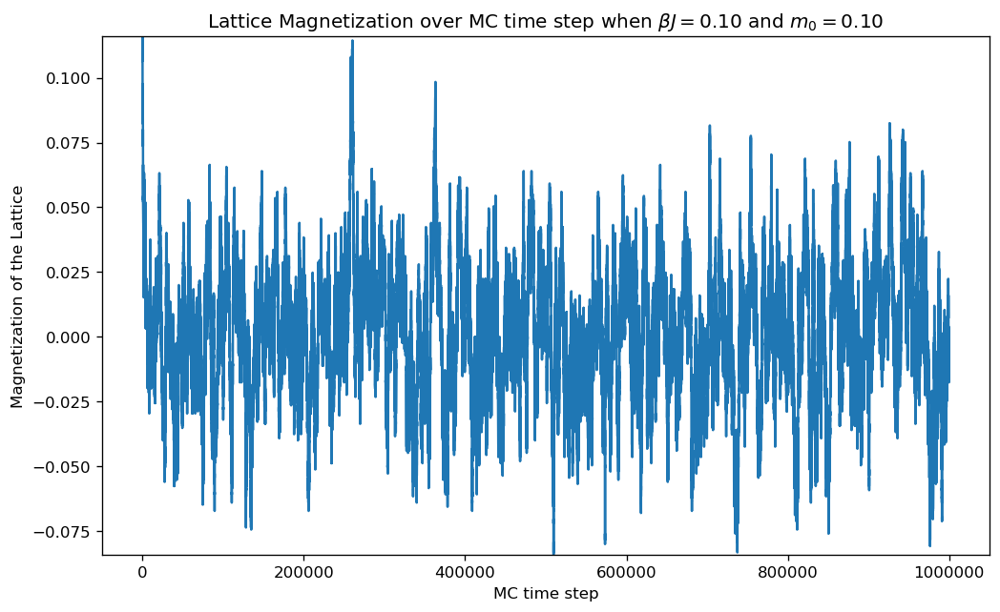

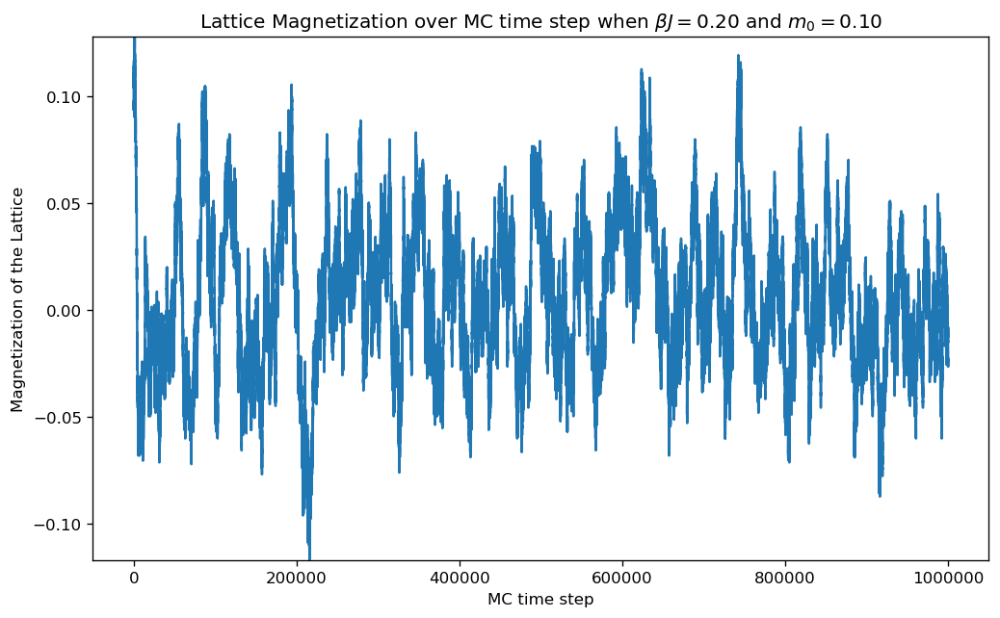

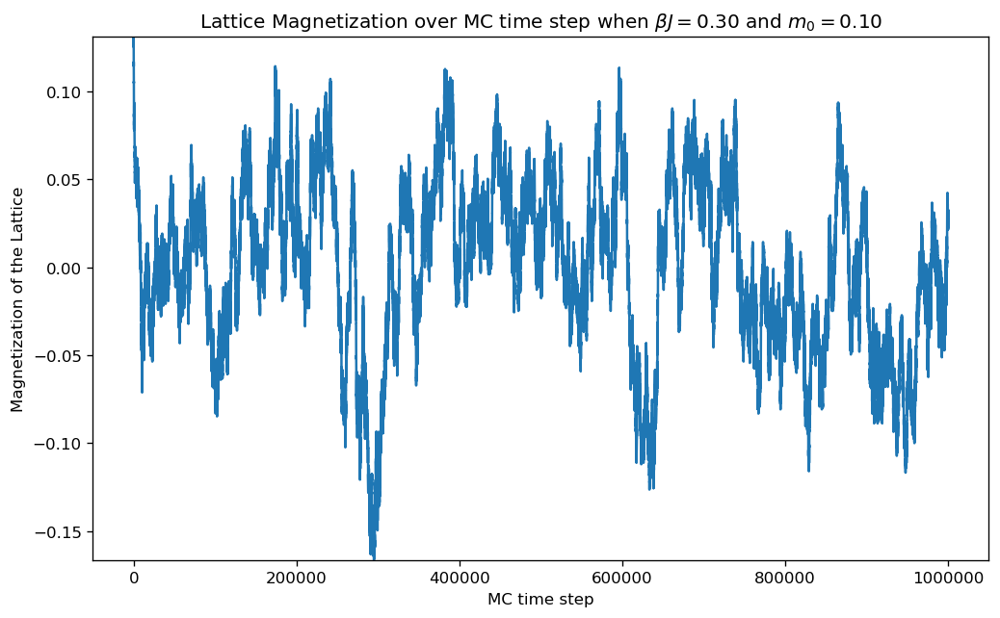

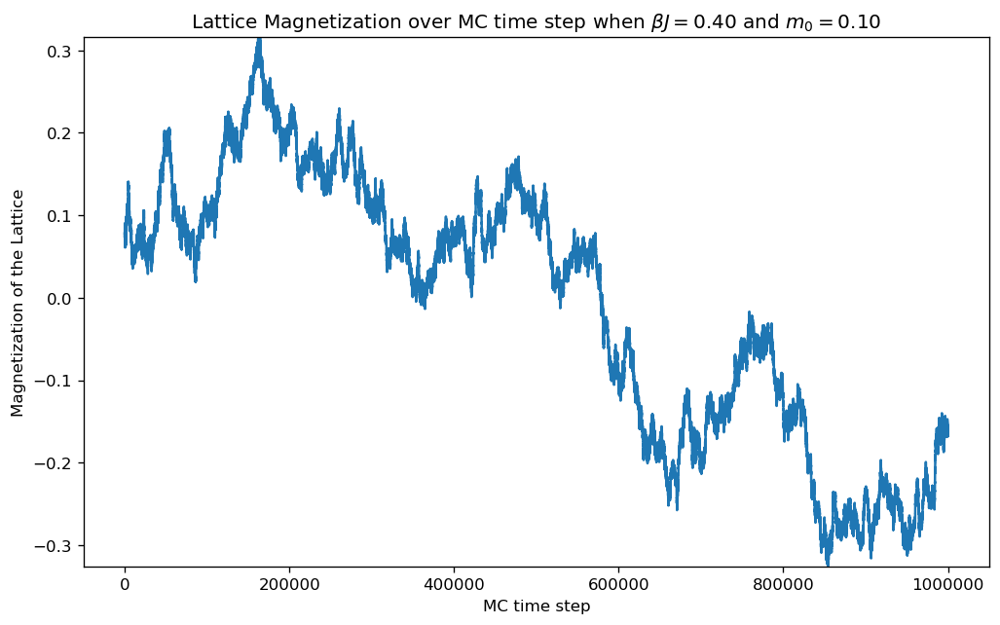

...

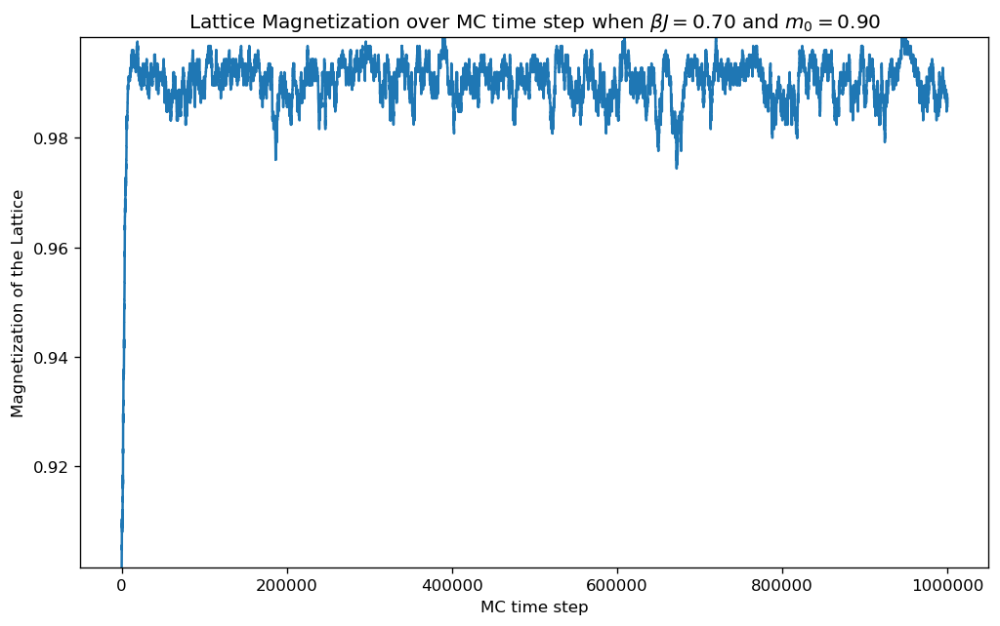

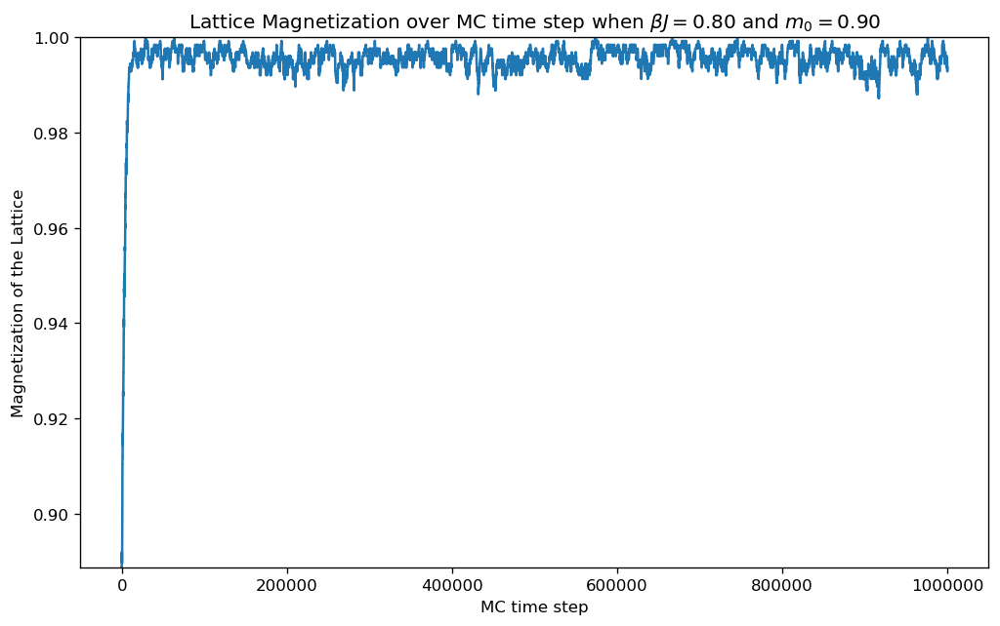

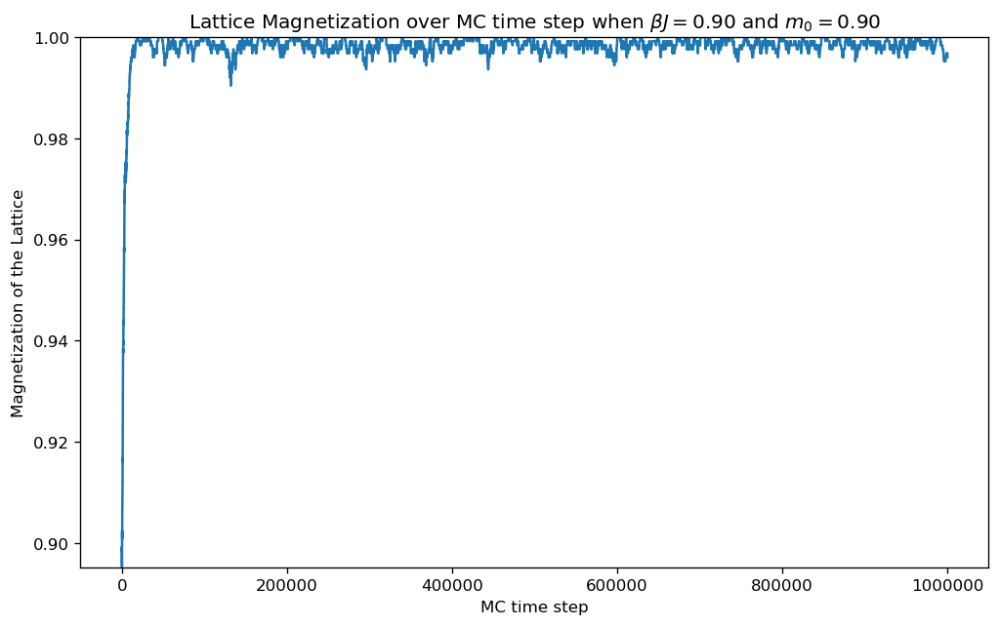

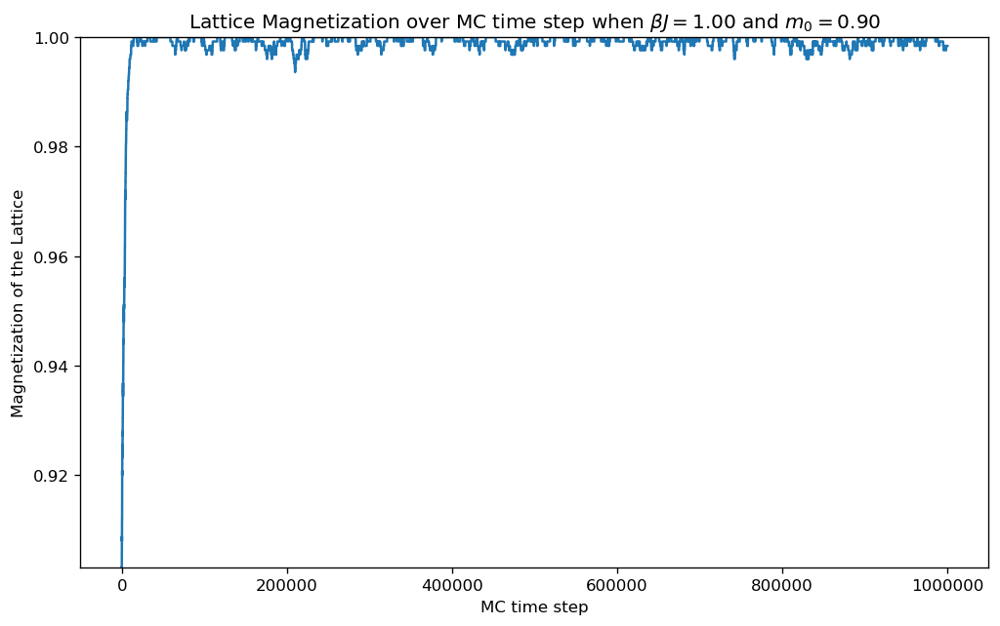

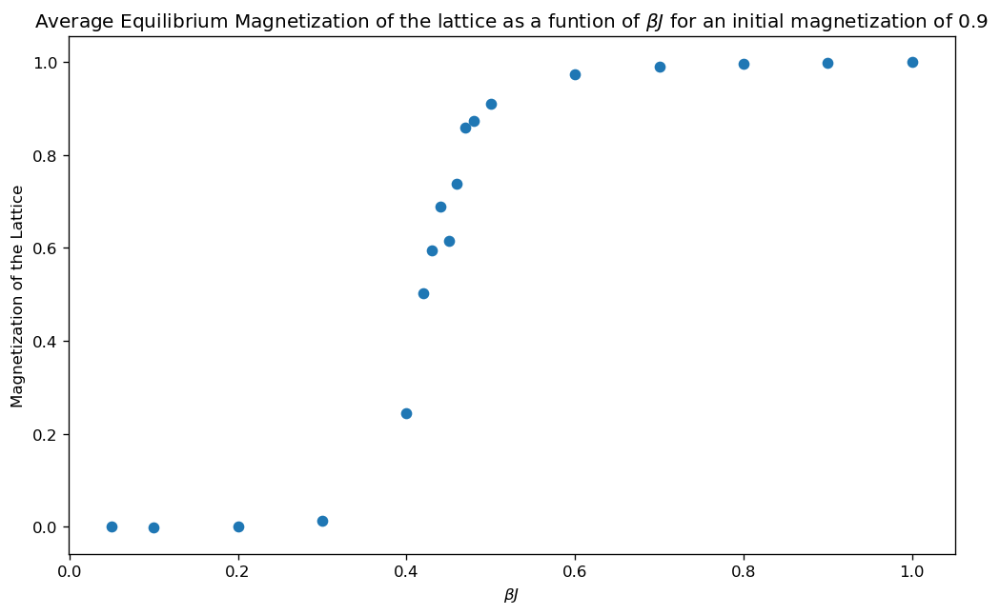

In [32]:
# m_0 = [0.1, 0.3, 0.5, 0.7, 0.9], l = 50
m_0 = [0.1, 0.3, 0.5, 0.7, 0.9]
for m in m_0:
    run_MC(50, m, 10**6)
# end for

### Negative Initial Magnetization

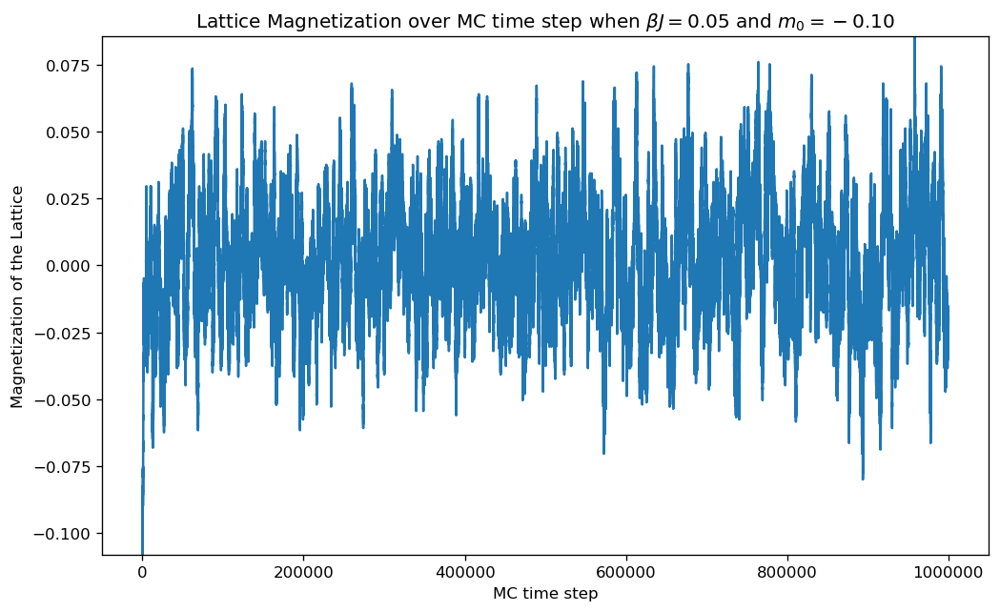

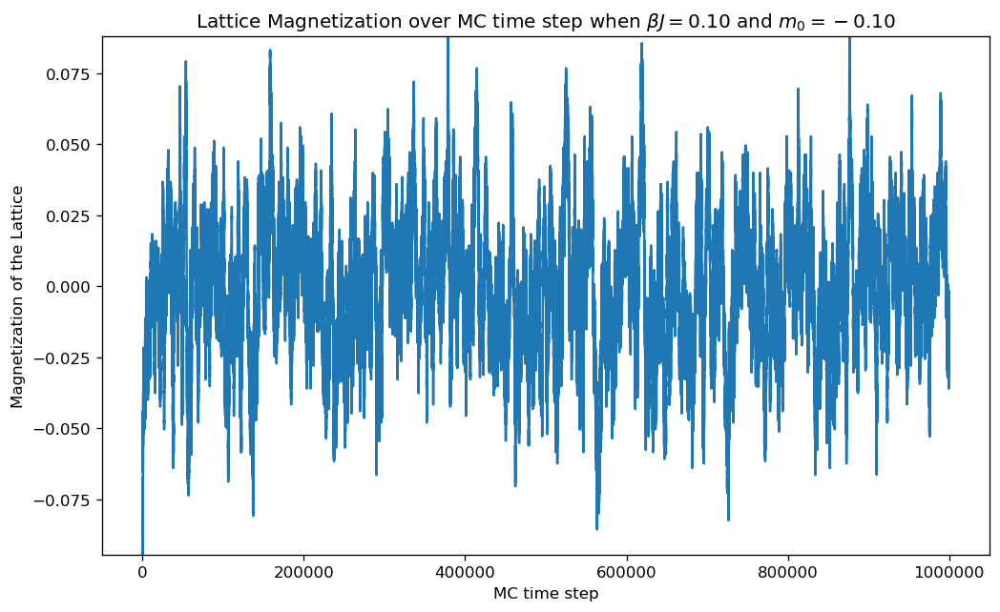

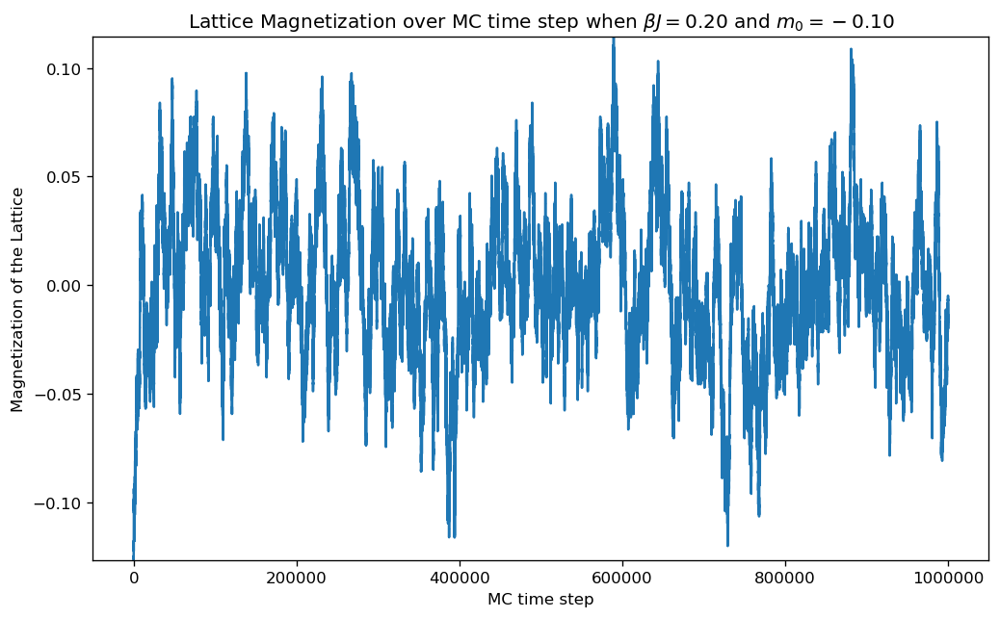

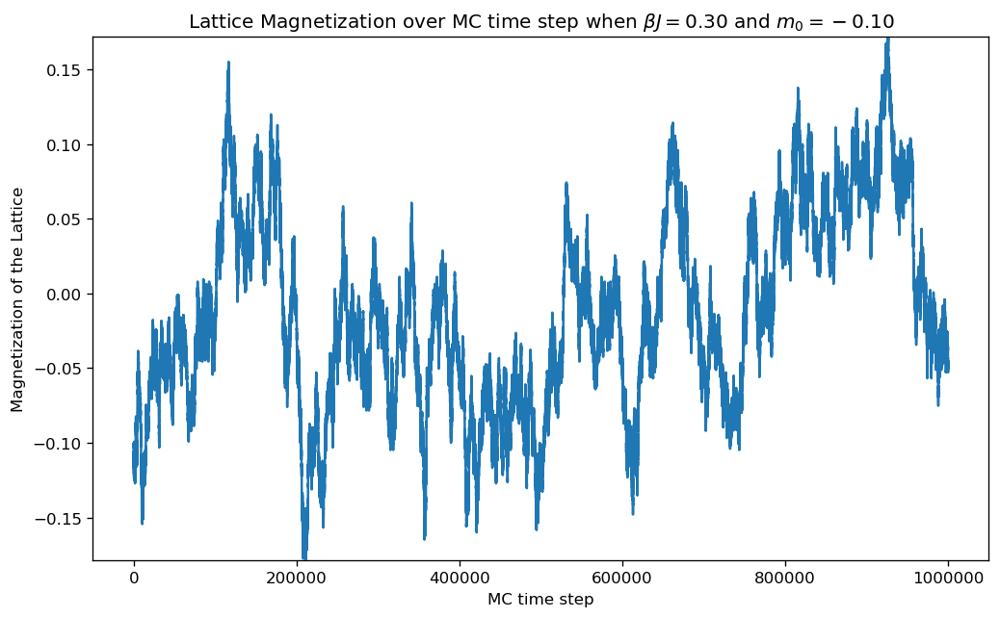

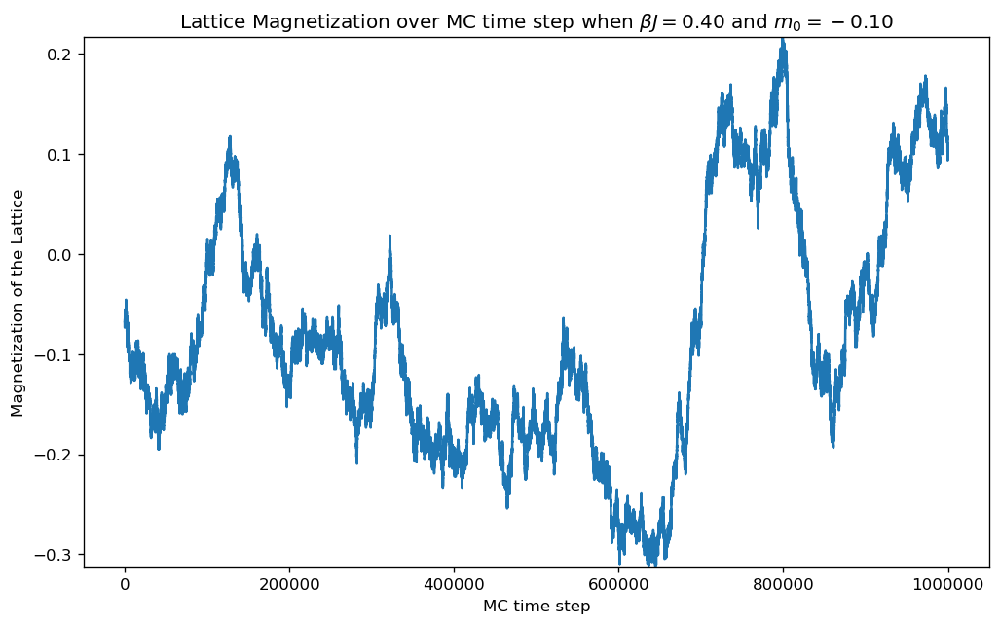

...

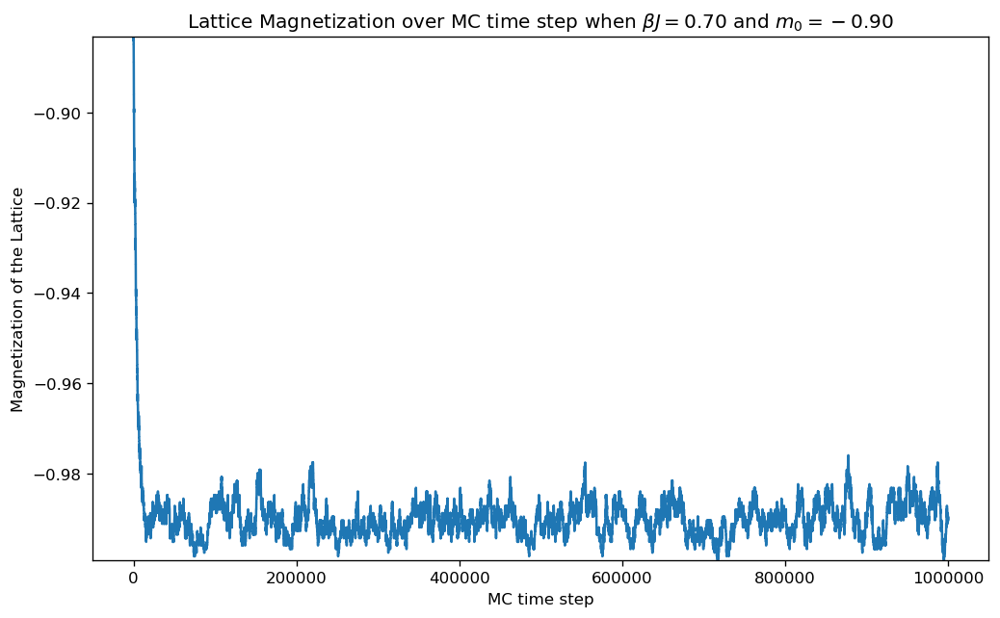

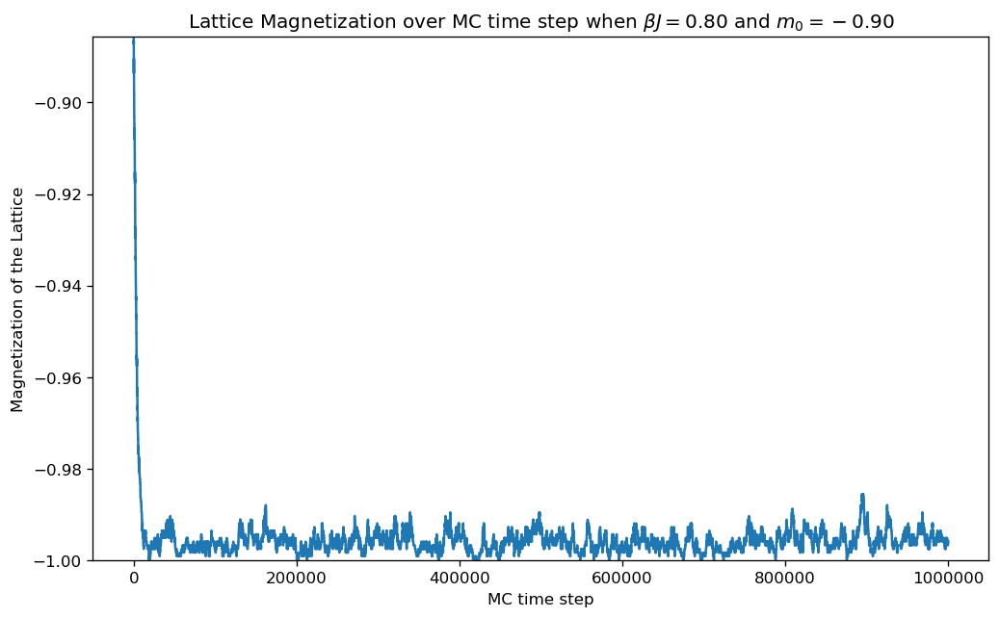

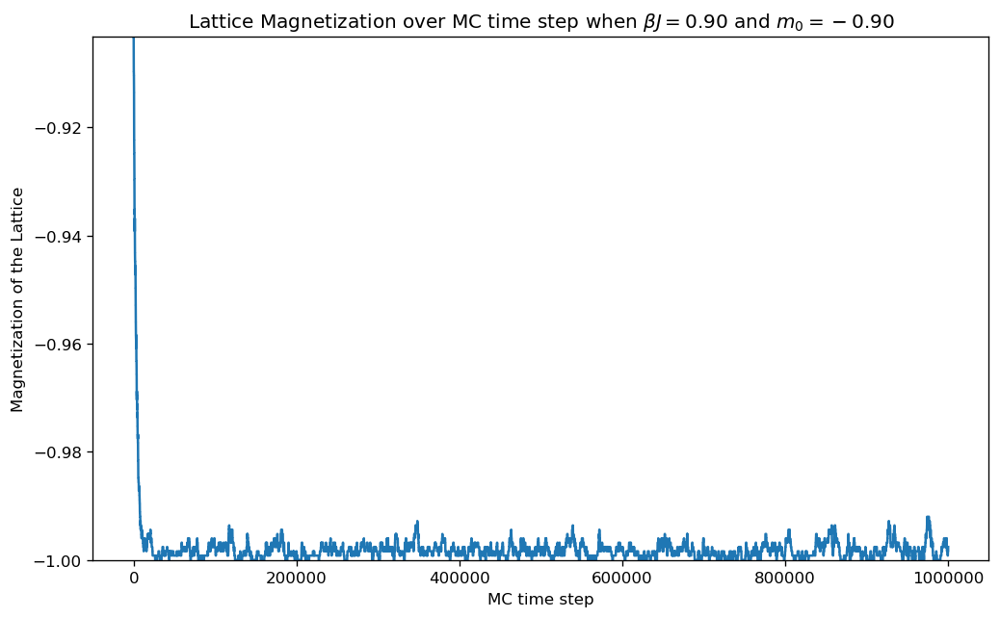

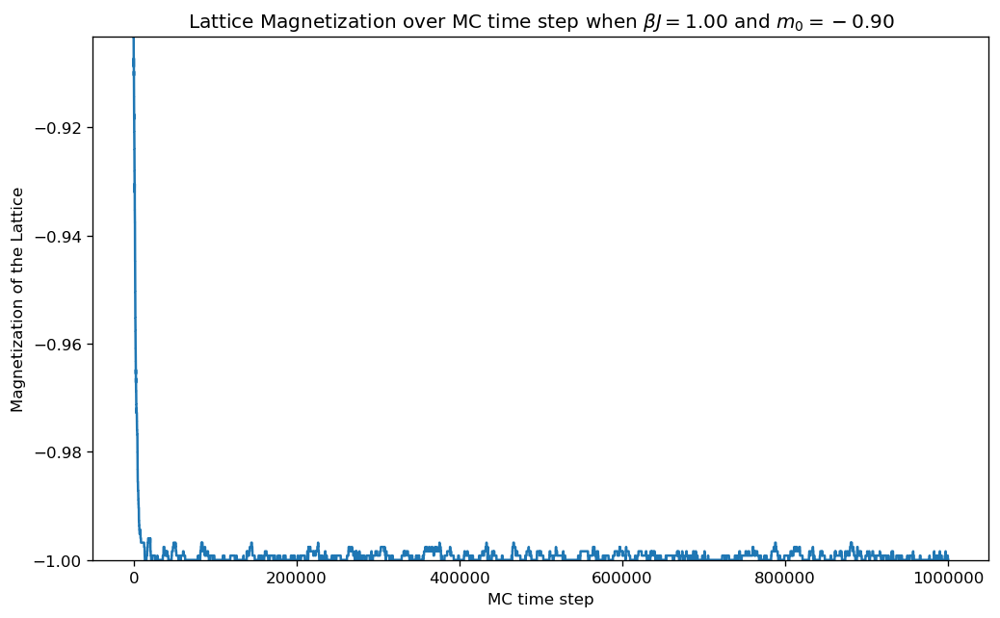

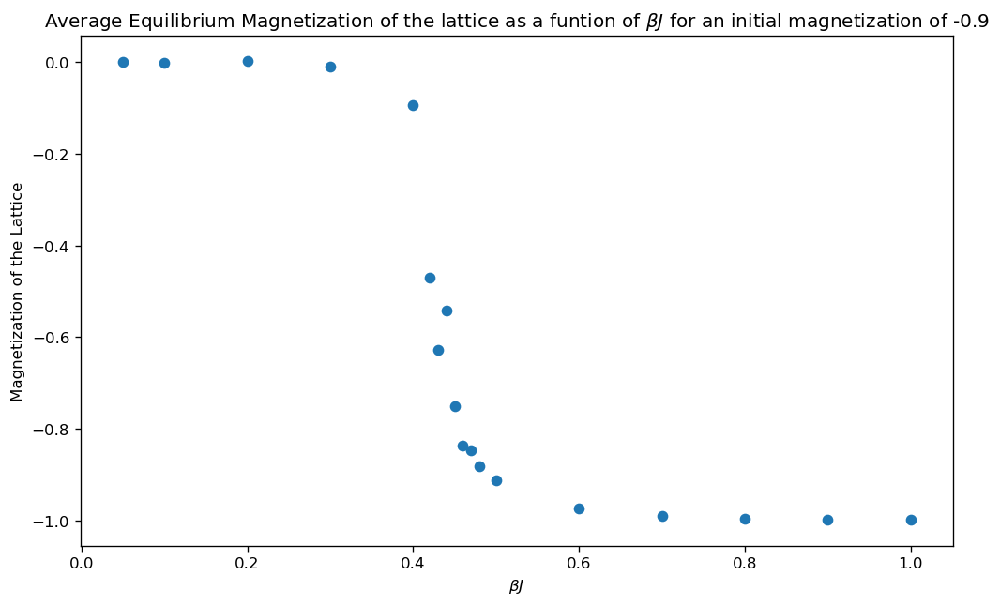

In [33]:
# m_0 = -[0.1, 0.3, 0.5, 0.7, 0.9], l = 50
for m in m_0:
    run_MC(50, -m, 10**6)
# end for

### Comments on the Ising Model

1) Time to equilibrium: For values of near $\beta J = \frac{J}{kT_c} \approx 0.441J$, the Monty Carlo approach does not converge to equilibrium. For all other values of $\beta J$ equilibrium was reached relatively fast, taking on the order of 10,000 to 100,000 MC time steps.

2) Does the time to equilibrium depend on the initial magnetization: As we can see from all the plots above with different initial magnetizations at different $\beta J$ values. In fact we showed initial magnetizations $m_0 = $ [-0.1, -0.3, -0.5, -0.7, -0.9, 0.1, 0.3, 0.5, 0.7, 0.9] all at values of $\beta J = $ [0.05, 0.1, 0.2, 0.3, 0.4, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.50, 0.6, 0.7, 0.8, 0.9, 1] plus the mean magnetization plots, giving us a total of $10\times18 + 10 = 190$ plots! 

When $m_0$ is positive and $\beta J < \frac{J}{kT_c}$: Equilibrium approaches zero from $m_0$. 

When $m_0$ is positive and $\beta J > \frac{J}{kT_c}$: Equilibrium approaches one from $m_0$.

When $m_0$ is negative and $\beta J < \frac{J}{kT_c}$: Equilibrium approaches zero from $m_0$. 

When $m_0$ is negative and $\beta J > \frac{J}{kT_c}$: Equilibrium approaches negative  one from $m_0$. 

In all cases, if $m_0$ is small then time to equilibrium takes longer than when m_0 is large.


3) Do you see a signature of the phase transition: When we analyze the 10 average equilibrium magnetization of the lattice plots, we see a signature phase transition around $\beta J \approx 0.44J$, which is approximately $kT_c \approx 2.269J$
